<a href="https://colab.research.google.com/github/SamuelBM21/IC/blob/main/HorsesOrHumansTransferVGG.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import torch                        #PyTorch
import torch.nn as nn               #Camadas da Rede neural
import torch.optim as optim         #Otimizadores
import torchvision                  #Datasets
import numpy as np
import random
from torchvision import transforms,datasets, models
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader, random_split
import matplotlib.pyplot as plt     #Visualização

In [ ]:
batch_size = 64
learning_rate = 0.0001
epochs = 10

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
train_transforms = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.RandomRotation(15),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],  # ImageNet
                         std=[0.229, 0.224, 0.225])
])

test_transforms = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])  # Mesma normalização
])


train_data = datasets.ImageFolder('/content/drive/MyDrive/DataSets/horsehuman_train', transform=train_transforms)
test_data = datasets.ImageFolder('/content/drive/MyDrive/DataSets/horsehuman_test', transform=test_transforms)


val_ratio = 0.2
val_size = int(len(train_data) * val_ratio)
train_size = len(train_data) - val_size

train_dataset, val_dataset = random_split(train_data, [train_size, val_size])

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_data, batch_size=batch_size)

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = models.vgg16(pretrained=True)

# Congelar todas as camadas
for param in model.parameters():
    param.requires_grad = False

# Substituir a camadas
model.classifier = nn.Sequential(
    nn.Linear(25088, 4096),  # Matches flattened 7×7×512
    nn.ReLU(True),
    nn.Dropout(0.5),
    nn.Linear(4096, 4096),
    nn.ReLU(True),
    nn.Dropout(0.5),
    nn.Linear(4096, 2)  # Final layer for binary classification
)

# A nova camada será treinada
for param in model.classifier.parameters():
    param.requires_grad = True

model = model.to(device)

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

In [ ]:
def train_model(model, train_loader, val_loader, criterion, optimizer, num_epochs):
    for epoch in range(num_epochs):
        model.train()
        train_loss = 0
        correct = 0
        total = 0

        for inputs, labels in train_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            train_loss += loss.item()
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

        acc = 100 * correct / total
        print(f"Epoch {epoch+1}, Train Loss: {train_loss:.4f}, Accuracy: {acc:.2f}%")

        # Validação
        model.eval()
        val_correct = 0
        val_total = 0
        with torch.no_grad():
            for inputs, labels in val_loader:
                inputs, labels = inputs.to(device), labels.to(device)
                outputs = model(inputs)
                _, predicted = outputs.max(1)
                val_total += labels.size(0)
                val_correct += predicted.eq(labels).sum().item()
        val_acc = 100 * val_correct / val_total
        print(f"Val Accuracy: {val_acc:.2f}%")

train_model(model, train_loader, val_loader, criterion, optimizer, num_epochs=epochs)


Epoch 1, Train Loss: 2.7452, Accuracy: 86.95%
Val Accuracy: 100.00%
Epoch 2, Train Loss: 0.1174, Accuracy: 99.62%
Val Accuracy: 100.00%
Epoch 3, Train Loss: 0.0039, Accuracy: 100.00%
Val Accuracy: 98.46%
Epoch 4, Train Loss: 0.0129, Accuracy: 100.00%
Val Accuracy: 99.23%
Epoch 5, Train Loss: 0.0001, Accuracy: 100.00%
Val Accuracy: 100.00%
Epoch 6, Train Loss: 0.0009, Accuracy: 100.00%
Val Accuracy: 100.00%
Epoch 7, Train Loss: 0.0001, Accuracy: 100.00%
Val Accuracy: 100.00%
Epoch 8, Train Loss: 0.0009, Accuracy: 100.00%
Val Accuracy: 100.00%
Epoch 9, Train Loss: 0.0014, Accuracy: 100.00%
Val Accuracy: 100.00%
Epoch 10, Train Loss: 0.0004, Accuracy: 100.00%
Val Accuracy: 100.00%


In [ ]:
#IMAGENS DE TESTE
def test_model(model, dataloader):
    model.eval()
    correct = 0
    total = 0
    with torch.no_grad():
        for images, labels in dataloader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    print(f"Acurácia no teste: {100 * correct / total:.2f}%")

test_model(model,test_loader)

Acurácia no teste: 100.00%


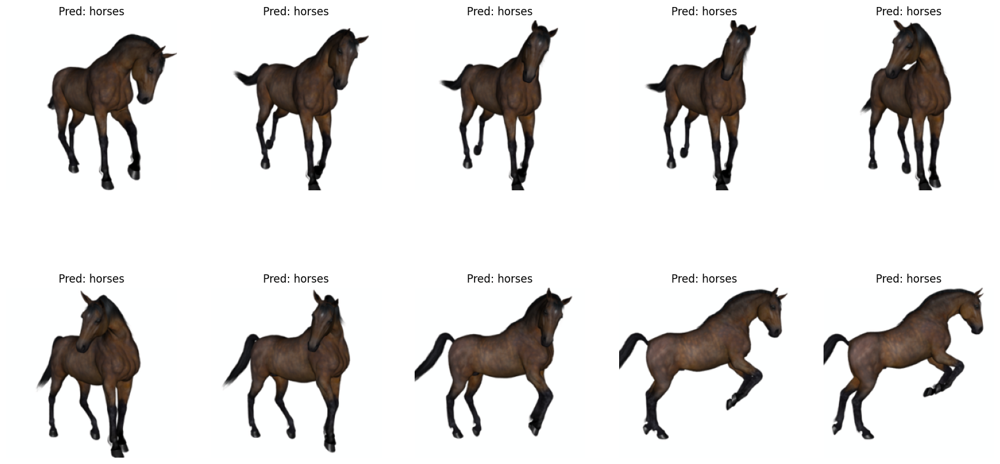

In [ ]:
def visualize_predictions(model, dataloader, class_names, num_images=6):
    model.eval()
    images_shown = 0

    plt.figure(figsize=(20, 10))

    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs = inputs.to(device)
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            for i in range(inputs.size(0)):
                if images_shown == num_images:
                    plt.show()
                    return

                image = inputs[i].cpu().numpy().transpose((1, 2, 0))
                image = image * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])  # unnormalize
                image = np.clip(image, 0, 1)

                plt.subplot(2, 5, images_shown + 1)
                plt.imshow(image)
                plt.title(f'Pred: {class_names[preds[i]]}')
                plt.axis('off')
                images_shown += 1

visualize_predictions(model, test_loader, train_data.classes, num_images=10)

Acurácia no teste: 100.00%


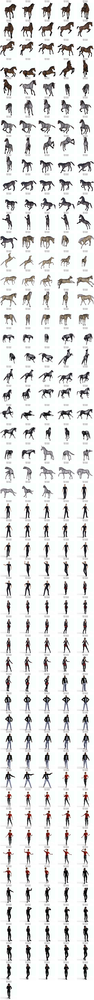

In [ ]:
def test_and_visualize_all(model, dataloader, class_names):
    model.eval()
    correct = 0
    total = 0

    num_images = len(dataloader.dataset)
    cols = 5
    rows = (num_images + cols - 1) // cols
    fig = plt.figure(figsize=(cols * 4, rows * 4), constrained_layout=True)

    index = 1
    with torch.no_grad():
        for images, labels in dataloader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, preds = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (preds == labels).sum().item()

            for i in range(images.size(0)):
                image = images[i].cpu().numpy().transpose((1, 2, 0))
                image = image * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])
                image = np.clip(image, 0, 1)

                ax = fig.add_subplot(rows, cols, index)
                ax.imshow(image)
                ax.set_title(f"Pred: {class_names[preds[i]]}\nTrue: {class_names[labels[i]]}")
                ax.axis("off")
                index += 1

    print(f"Acurácia no teste: {100 * correct / total:.2f}%")

test_and_visualize_all(model, test_loader, train_data.classes)